In [1]:
# import necessary packages
import os
import pandas
import numpy
import matplotlib.pyplot as plt
import geopandas as gpd
from pathlib import Path
# import function for querying DOE dataframes
from monte_carlo_utils import get_DOE_atb



# set file location and name
atb_shp_path = Path('/data/MIDOSS/shapefiles/atb_2018_01.shp')
atb_mmsi_xls_path = Path('/data/MIDOSS/marine_transport_data/ATB_oil_capacity.xlsx')
atb_fill_xls_path = Path('/data/MIDOSS/marine_transport_data/ATB_fullness.xlsx')
doe_xls_path = Path('/data/MIDOSS/spreadsheets/MuellerTrans4-30-20.xlsx')
fac_xls_path = Path(
    '/home/rmueller/Projects/MIDOSS/marine_transport_data/Oil_Transfer_Facilities.xlsx'
)

# import shapefile using geopandas
atb_shp = gpd.read_file(atb_shp_path)

# import facility locations
facWA = pandas.read_excel(
    fac_xls_path,
    sheet_name = 'Washington',
    usecols="B,D,J,K"
)
facBC = pandas.read_excel(
    fac_xls_path,
    sheet_name = 'British Columbia',
    usecols="A,B,C"
)
atbs = pandas.read_excel(
    atb_mmsi_xls_path,
    sheet_name = 'Cargo Capacities',
    usecols="A,D"
)
# drop rows where MMSI are missing
atbs = atbs.dropna().reset_index(drop=True)

# view  the top 6 lines of attribute table of data
atb_shp.head(1)

,MMSI_NUM,ST_DATE,EN_DATE,LENGTH,TO,FROM_,geometry
0,316001223.0,2018-01-01 00:03:48,2018-01-01 00:05:58,41,US,US,"LINESTRING (-122.77574 48.33663, -122.77796 48..."


In [2]:
atb_fill = {}
atb_name = 'ATB BARGE ALL ABOARD FOR A CURE'
atb_fill[atb_name] = pandas.read_excel(
    atb_fill_xls_path,
    sheet_name = atb_name,
    usecols = "E"
)
facility_list = atb_fill[atb_name].groupby('Facility').count().index.tolist()

## Loop through ATB names and use paired MMSI to select and plot AIS ship tracks
- `ATB_oil_capacity.xlsx` gives ATB names and MMSI 
- `Oil_Transfer_Facilities.xlsx` gives lat/lon information for transfer locations
- `ATB_fullness.xlsx` gives information on transfer locations an number of transfers (dataframe length) for each barge

This notebook does the following
- Create yearly data for ATB ship tracks
- creates a list of oil transfer terminals associated with each ATB using `ATB_fullness.xlsx`
- attributes lat/lon values to transfer terminal 
- plots ship tracks with oil transfer sites

In [3]:
# create list of names and MMSI from "Top_six_ATBs_by_DOEtransfers.xlsx"
# NOTE: Island Trader has 3 possible MMSI.  Exploring all three options
MMSI_names = ['ALL ABOARD FOR A CURE','DBL 185','ISLAND TRADER',
              '550-2','ONEDREAM',
              'ISLAND TRADER','ISLAND TRADER']
MMSI_list = [368013040, 338616000, 316001221, 369580000, 367740790,316001223,316006101]
MMSI_colors = ['indigo','olive','lightseagreen',
               'darkgoldenrod','royalblue',
               'mediumturquoise','mediumaquamarine']
# create dictionary linking MMSI to barge name
MMSI_dict = {MMSI_list[num]:MMSI_names[num] for num,name in enumerate(MMSI_names)}
color_dict = {MMSI_list[num]:MMSI_colors[num] for num,name in enumerate(MMSI_names)}

## Create yearly data for ATB ship tracks

In [4]:
%%time
atb_shp_path = {}
atb_shp={}

for months in range(1,13):
    #print(f'{months:02d}')
    # set file location and name
    atb_shp_path[months] = Path(f'/data/MIDOSS/shapefiles/atb_2018_{months:02d}.shp')

    # import shapefile using geopandas
    atb_shp[months] = gpd.read_file(atb_shp_path[months])
    
    if months == 1:
        print('creating shapefile for 2018, starting with January data')
        atb_shp_2018 = atb_shp[months]
    else:
        print(f'Concatenating data from month {months}')
        atb_shp_2018 = gpd.GeoDataFrame(pandas.concat([atb_shp_2018, atb_shp[months]]))
        


creating shapefile for 2018, starting with January data
Concatenating data from month 2
Concatenating data from month 3
Concatenating data from month 4
Concatenating data from month 5
Concatenating data from month 6
Concatenating data from month 7
Concatenating data from month 8
Concatenating data from month 9
Concatenating data from month 10
Concatenating data from month 11
Concatenating data from month 12
CPU times: user 37.2 s, sys: 756 ms, total: 38 s
Wall time: 38 s


### Create a list of oil transfer terminals for each atb

In [13]:
cmap=plt.get_cmap('viridis')
atb_colors = cmap(numpy.arange(0,.95,.95/len(atbs['MMSI'])))

In [14]:
atb_colors[0]

array([0.267004, 0.004874, 0.329415, 1.      ])

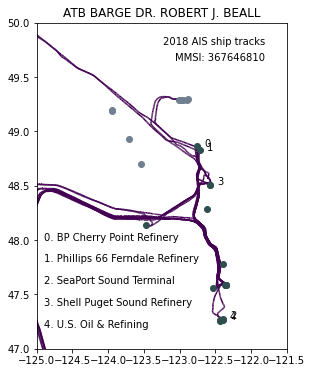

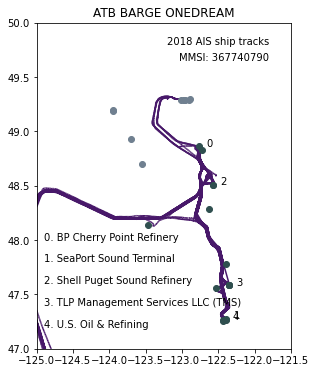

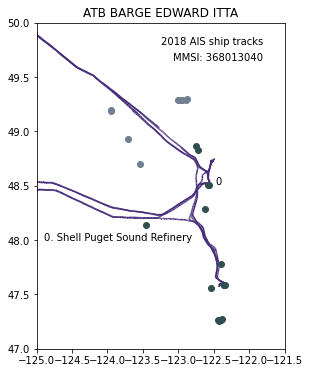

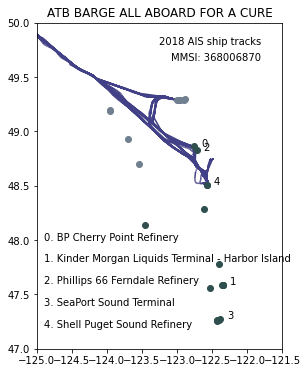

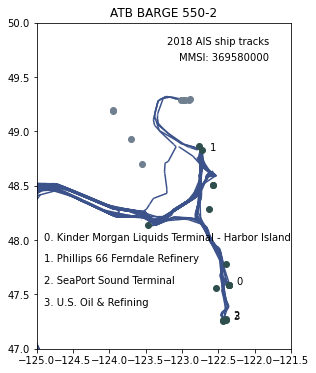

...

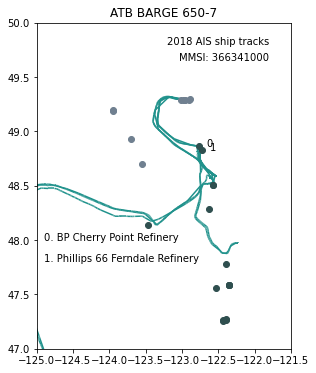

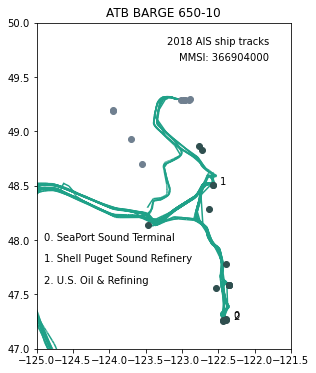

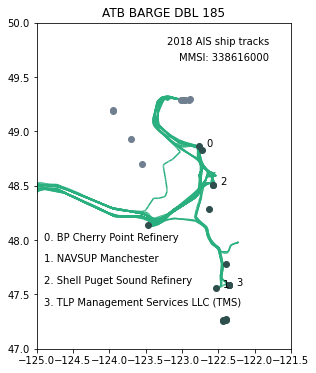

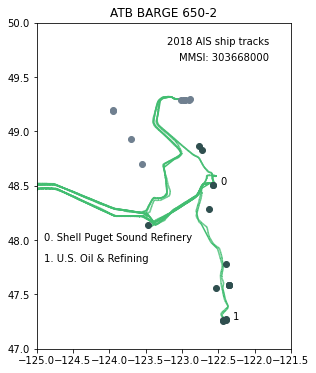

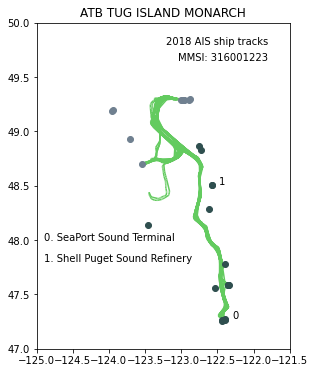

In [15]:
#extract information for particular MMSI
atb_shp_indv={}
for m_idx,MMSI in enumerate(atbs['MMSI']):
    # Plot ship track data
    atb_shp_indv[MMSI] = atb_shp_2018.loc[atb_shp_2018['MMSI_NUM']==MMSI]
    # plot the data using geopandas .plot() method  
    fig, ax = plt.subplots(figsize = (6,6))
    if atb_shp_indv[MMSI].empty==False:
        atb_shp_indv[MMSI].plot(ax=ax, color=atb_colors[m_idx])
        ax.plot(
            facBC["Longitude"],facBC["Latitude"], 
            color='slategrey', marker='o', linestyle='None'
        )
        ax.plot(
            facWA["DockLongNumber"],facWA["DockLatNumber"], 
            color='darkslategrey', marker='o', linestyle='None'
        )
        ax.set_title(f'{atbs["DOE name"][m_idx]}')
        ax.set_xlim(-125,-121.5)
        ax.set_ylim(47,50)   
    ax.text(-121.8,49.8,'2018 AIS ship tracks', horizontalalignment='right')
    ax.text(-121.8,49.65,f'MMSI: {MMSI}', horizontalalignment='right')
    # load data on facility transfers using name of atb associated with given MMSI
    atb_name = atbs["DOE name"][m_idx]
    atb_fill[atb_name] = pandas.read_excel(
        atb_fill_xls_path,
        sheet_name = atb_name,
        usecols = "E"
    )
    # create list of facility names for given atb
    facility_list = atb_fill[atb_name].groupby('Facility').count().index.tolist()
    # identify lat/lon for each facility in list and plot location on figure
    for idx,name in enumerate(facility_list):
        fac_idx = [i for i, s in enumerate(facWA.FacilityName) if name in s]
        ax.text(facWA.DockLongNumber[fac_idx]+.1,facWA.DockLatNumber[fac_idx],f'{idx}', horizontalalignment='left')
        ax.text(-124.9, 48-.2*idx, f'{idx}. {name}', horizontalalignment='left')
#     ax[0].text(-121.8,49.50,f'Import/Export (volume): {qty_fraction:.2f}', horizontalalignment='right')
#     ax[0].text(-121.8,49.35,f'Import/Export (transfers): {transfer_fraction:.2f}', horizontalalignment='right')

    # plt.savefig(f'{MMSI}.png',bbox_inches='tight')
    plt.show()

## Choose top 1-3 ATBs and tally up ship tracks with None, Canada, US, Pacific attributions.  Compare to marine terminal attributions